# SageMath problems

Here is a collection of problems to explore the functionalities provided by SageMath.

* The first two problems cover material typically seen in the first year of an undergraduate curriculum in math, and are problems from calculus and linear algebra.
* The third problem supposes minimal knowledge of [Markov chains](https://en.wikipedia.org/wiki/Markov_chain), and combines probability and linear algebra.
* The last problem is the most advanded problem on this worksheet and explores the use of mathematical databases for research. The example given here is a known bijection between two famous combinatorial objects, but the point of view taken is that of a student who would hear about the objects for the first time and explore them. Researchers in combinatorics will still learn from this problem, perhaps on the theoretical side, and very likely on the computational side with the use of databases.

License: CC-BY-NC-SA. Free to reuse and modify for non-commercial purposes.
Author: Nadia Lafrenière

# A multivariable calculus problem: intersection of two surfaces

(a) Create a plot for the sphere of radius $3$, centered at the origin. Make the sphere relatively translucent, so that when we add the pictures together in part (d), we can see details of the inside.
    
(b) Create a plot for the cylinder given by implicit equation $(x-\frac{3}{2})^2 + y^2 = (\frac{3}{2})^2$. Make it grey. Again, make it relatively translucent.

(c) Find the equation of the curve of intersection of the sphere from part (a) and the cylinder from part (b). Your answer could be an equation or a list of equations.

(d) Draw on the same graph the curve of intersection, as well as the sphere from part (a) and the cylinder from part (b).

*Hint: the sphere of radius $r$ centered at $(a,b,c)$ has equation $(x-a)^2+(y-b)^2+(z-c)^2=r^2$.*

In [3]:
# a
var('x,y,z')
paraboloid_eq = y == x^2 + z^2
paraplot = implicit_plot3d(paraboloid_eq, (-5,5), (0,25), (-5,5), opacity=0.2, color='green') #, viewer='tachyon')
paraplot

Graphics3d Object

In [4]:
# b
plane_eq = 2*x+y+3*z==4
planeplot = implicit_plot3d(plane_eq, (-5,5), (-1,25), (-5,5), opacity=0.2, color='purple')  #, viewer='tachyon')
planeplot

Graphics3d Object

In [5]:
# c
intersection = solve([plane_eq, paraboloid_eq], x,y)
intersection

[[x == -sqrt(-z^2 - 3*z + 5) - 1, y == -3*z + 2*sqrt(-z^2 - 3*z + 5) + 6],
 [x == sqrt(-z^2 - 3*z + 5) - 1, y == -3*z - 2*sqrt(-z^2 - 3*z + 5) + 6]]

In [6]:
# To find what values of z can be used for the domain:
(lower_bound, upper_bound) = sorted([eq.rhs() for eq in solve(-z^2 - 3*z + 5)])
lower_bound, upper_bound

(-1/2*sqrt(29) - 3/2, 1/2*sqrt(29) - 3/2)

In [8]:
# d
planeplot+paraplot+parametric_plot3d(
    [(intersection[i][0].rhs(), intersection[i][1].rhs(), z) for i in range(2)],
    (z, lower_bound+0.001, upper_bound-0.001), thickness=3, color='black')

Graphics3d Object

# Solving systems of equations

(a)  What are all the values of $a$ for which the following system does not have a unique solution? You can use whatever method you want, but you should justify it.
$$ \left(\begin{array}{rrrr}
a & 1 & 2 & 3 \\
1 & a & 2 & 3 \\
1 & 2 & a & 3 \\
1 & 2 & 3 & a
\end{array}\right)\cdot
\left(\begin{array}{r}
v_1\\ v_2\\v_3\\v_4
\end{array}\right) = \left(\begin{array}{r}
1 \\ 2\\ 3\\ 4
\end{array}\right).$$

(b) Find the solution to the following systems of equation: 
$$\left\{\begin{array}{c} x^2+3y^2+2z^2=1\\ 2x+3y+4z=0 \end{array}\right..$$

(c) Verify your answer from part (b) by displaying the surfaces corresponding to each equation in your system. The intersection of the two surfaces should be the solution to your system of equations.

In [10]:
var('a')
M = Matrix(QQ[a], 4,4, (a,1,2,3, 1,a,2,3, 1,2,a,3, 1,2,3,a))

In [13]:
d = M.determinant(); d.roots(multiplicities=False)
# values of a for which the determinant is 0
# There exists a unique solution when the determinant is nonzero

[3, 2, 1, -6]

In [ ]:
# No solution when a=-6
v = SR.var('v',4)
solve([-6*v[0] +v[1]+2*v[2]+3*v[3]==1, v[0]-6*v[1]+2*v[2]+3*v[3]==2, v[0]+2*v[1]-6*v[2]+3*v[3]==3, v[0]+2*v[1]+3*v[2]-6*v[3]==4],v)

There's no solution when $a$ is either 1,2,3, because then the matrix has two repeated lines, but the outputs are different on the right. There's also no solution when $a$ is -6, as shown above.

In all other cases, the determinant of the matrix is non-zero, so there is a unique solution to the linear system of equations.

In [14]:
# b
var('x,y,z')
solution = solve([x^2+3*y^2+2*z^2==1, 2*x+3*y+4*z==0], y,z); solution

[[y == -2/11*x - 2/33*sqrt(-90*x^2 + 66),
  z == -4/11*x + 1/22*sqrt(-90*x^2 + 66)],
 [y == -2/11*x + 2/33*sqrt(-90*x^2 + 66),
  z == -4/11*x - 1/22*sqrt(-90*x^2 + 66)]]

In [19]:
# c. It was asking for the intersection of an ellipsoid with a plane, so we get an ellipse.
(implicit_plot3d(2*x+3*y+4*z==0, (-3,3),(-3,3),(-3,3), color='grey', opacity=0.3)
 + implicit_plot3d(x^2+3*y^2+2*z^2==1, (-3,3),(-3,3),(-3,3), color='yellow', opacity=0.3)
 + parametric_plot3d((x,solution[0][0].rhs(), solution[0][1].rhs()), (-sqrt(66/90),sqrt(66/90)), thickness=3)
 + parametric_plot3d((x,solution[1][0].rhs(), solution[1][1].rhs()), (-sqrt(66/90),sqrt(66/90)), thickness=3))

Graphics3d Object

# Median time of a random walk through simulation and a Markov chain

## Snakes and ladders!
Snakes and ladders is a game involving rolling a dice. At each turn, the player rolls the dice and advances the number of cells that is shown on the dice. If the player reaches a cell which is the base of a ladder, the player has to climb up that ladder and if they reach a cell that is the top of the snake, they have to go down to the bottom of the snake without a dice throw. The player who reaches the last cell first wins the game.

An example of a (small) snakes and ladders grid is displayed here.

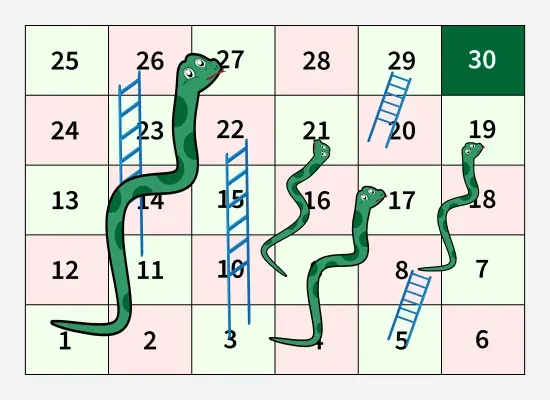

(Picture credit: Geeks for geeks)


We can show, for example, that a very lucky player could win the game with just three rolls.

However, since most players are not that lucky, a reasonable question to ask is how long does a game last, either in average, or just the median game?

 * The average time is given by $\sum_{n\geq 0} n\ p(n)$, where $p(n)$ is the probability that the game is won with $n$ rolls.
    
 * The median time is given as the value of $n$ for which there is the same probability of finishing before $n$ rolls or after at least $n$ rolls. 

The median time is less sensitive to the impact of a very long game.

(a) Use a simulation where 100 games of snakes and ladders are played, and find the (experimental) median number of rolls. This is the number $k$ for which there is 50 games that took less than or equal to $k$ turns and 50 games took more than or equal to $k$ turns. $k$ is either an integer, or the average of two integers. The easiest ways to find the median when there are 100 attempts are either to sort the data and get the average of the 50th and 51st value, or to use `median(L)` for a list `L`.

*Hint*: for simulations, useful functions include `random`, `randint` and `uniform`. I invite you to read the documentation for these functions.

(b) Build the transition matrix of the Markov chain corresponding to the snakes and ladders game. The states are the cells on the board, and the transitions are given by the probability of moving from one cell to another in one roll of dice. Make sure that the matrix you created is stochastic. (You do not have to display the matrix.)

*Hint*: for this problem, if is highly recommended that you test your code with a smaller matrix. You can design an easy board of snakes and ladders with 15 cells, two snakes and two ladders, for example, and make sure that you get the right thing.

(c) Using the transition matrix, find the median time it takes to finish a game: this is the smallest value of $n$ for which there is a probability at least 50% of having hit the last cell in $k$ rolls of the dice.

*Remark*: To get to the last cell, one must roll the exact value that would make the player land on that cell. For example, if a player is at cell $28$ and wants to reach $30$, they must roll a $2$. If they roll a $1$, they land on $29$ and they have to roll a $1$ again. If they roll $3$ or higher, they stay in place at $28$ until the next turn.


In [3]:
# Snakes and ladders board
n = 30
snakes_30 = [(27,1), (21,9), (19,8), (17,3)]
ladders_30 = [(11,26), (3,22), (20,29), (5,8)]

# One can use this code to check that a matrix is stochastic
def is_stochastic_matrix(M):
    l = M.nrows()
    return ([sum(_ for _ in M.row(i)) for i in range(l)] == [1 for i in range(l)]
            and all(entry >= 0 for row in M for entry in row))

In [2]:
# 1a

def snakes_and_ladders_simulation(n, snakes, ladders, verbose=True):
    cell = 1
    rolls = 0
    path = []
    # make snakes and ladders a dictionnary (combined)
    snakes_ladders = dict(snakes+ladders)
    while cell != n:
        rolls += 1
        dice = randint(1,6)
        path.append(cell)
        if cell + dice > n:
            continue  # does nothing; roll again
        elif cell + dice in snakes_ladders.keys():
            cell = snakes_ladders[cell + dice]
        else:
            cell += dice  # increment by the value on the dice.
    path.append(n)
    if verbose:
        print(path)
        print("Number of rolls is", rolls)
    return rolls

simulations_100 = [snakes_and_ladders_simulation(n, snakes, ladders, verbose=False) for _ in range(100)]
print("Simulated median over 30 cells:", median(simulations_100))  # You may have a different answer, since depends on a random seed

Simulated median over 30 cells: 12


In [15]:
# 1b
def snakes_and_ladders_transition_matrix(n, snakes, ladders):
    M = zero_matrix(QQ, n)
    for i in range(n):
        for dice in range(1,7):  # dice result
            j = i + dice
            if j < n:
                M[i,j] += 1/6 # One dice roll to move to i+dice
            else:
                M[i,i] += 1/6
    
    # Snakes + Ladders; we replace incoming edges to combine them with the snake/ladder; we may delete outgoing edges, but this is optional, as we can't get there
    snakes_ladders = dict(snakes+ladders)
    for source in snakes_ladders.keys():
        tip = snakes_ladders[source]
        for j in range(n):
            if M[j-1, source-1] != 0 and i != j:
                M[j-1, tip-1] += M[j-1, source-1]
                M[j-1, source-1] = 0
    
    return M
    
n = 30
snakes = [(27,1), (21,9), (19,8), (17,3)]
ladders = [(11,26), (3,22), (20,29), (5,8)] 
M30 = snakes_and_ladders_transition_matrix(n, snakes, ladders); M30

30 x 30 dense matrix over Rational Field (use the '.str()' method to see the entries)

In [6]:
is_stochastic_matrix(M30)  # checking that the matrix is stochastic (for 30 cells)

True

In [11]:
# 1c - Finding median for 30 cells
# We note that the cell of M^k that gives us the probability of finishing the game in at most k steps is the on in the top-right corner
k = 1
N = M30  # k = 1 mean N = M^1
while N[0][-1] < 1/2:
    k += 1
    N = N*M30
print("The median with 30 cells is", k)

The median with 30 cells is 11


In [14]:
#1c - Alternative to find the median for 30 cells: more efficient to do a binary search if we take a larger snakes and ladders grid
def find_median(M, a, b, check_a_b=True):
    """
    Assuming that the median value of the number of rolls is between a and b, finds the exact median using a binary search.
    A binary search works for ordered lists: if looking for an element x in a list between indices a and b, we compare
    x with the midpoint of a and b in that list, and repeat the search on a list that is half the size.
    
    INPUT:
    
     * M: Stochastic matrix, representing the Markov chain of the game. The probability of winning in n rolls is assumed to be increasing.
    
     * a,b (integers): lower and upper indices to search
    
     * check_a_b (boolean): if True, it verifies that the median lies between indices a and b.
    
    """ 
    def is_above_median(M, i):  # nested functions means `is_above_median` is only available from within find_median
        return (M^i)[0][-1] > 1/2
    
    if a + 1 == b:
        return b
    # Ideally, we check that (a,b) is a reasonable range, but it takes time. There's no need to do this within the recursion
    if check_a_b:
        assert(is_above_median(M, b) and not is_above_median(M, a))  # this raises and error if the median is not between a and b
    i = (b+a)//2  # integer division, i needs to be an integer, as this is an index
    print(i)  # optional. Useful for debugging
    if is_above_median(M, i):
        return find_median(M, a, i, check_a_b=False)
    else:
        return find_median(M, i, b, check_a_b=False)

find_median(M30, 1, 30)

15
8
11
9
10


11

In [13]:
# Also an alternative way to check, since we are only interested in the cell at position [0][-1]
n = 1
v = vector([0]*29+[1])  # M30*v gives the last column of M. 
while (M30*v)[0] <= 1/2:  # M30*v[0] gives the probability of going from 1 to 30 in n steps.
    v = M30*v
    n += 1
n

11

# Combinatorics using mathematical databases

The problems below use the databases OEIS and FindStat to identify an equivariant bijection between two classes of combinatorial objects.

Further information on the use of databases in SageMath can be found in the [Sage Reference Manual](https://doc.sagemath.org/html/en/reference/databases/index.html) or in the notebook on databases for experimental math posted with this file.

In [1]:
# These two lines are needed for the execution of FindStat code with SageMath
from sage.databases.findstat import *
findstat()._allow_execution = True

## Problem 1: Mountain ranges

We consider *paths* that have up-steps $(1,1)$ and down-steps $(1,-1)$ in the cartesian plane. Paths start at the origin and move right, going either up or down. Paths have finite length.

A path is a *mountain range*, if it lies in the first quadrant (including the positive $x$-axis), and ends on the $x$-axis.

For example, both paths below have three up-steps and three down-steps, but only the first one is a mountain range.
    
       /\
    /\/  \    /\
                \/\/

(a) Count the number of mountain ranges with $n$ up-steps and $n$ down-steps, for integer values of $n$ between $1$ and $8$. For this part, it is recommended that you define a function that, given a path, determines if it is a mountain range. You should also define a function that creates all paths.

(b) Use the OEIS to recognize the integer sequence that you get. Read the comments (`oeis(xxxx).comments()`, where `xxxx` is the sequence ID) to find the proper name of the mountain ranges. This is found in one of the first few comments.

In [2]:
# 1a)
# I use 1 for up-steps, 0 for down-steps

def is_mountain_range(path):  # path is a list or a tuple with the same number of 0's and 1's
    assert(set(path) == set([0,1]) and path.count(0) == path.count(1))  # Ends on the x-axis means same number of up- and down-steps
    zeros_so_far = 0
    ones_so_far = 0
    for step in path:
        if step == 0:
            zeros_so_far += 1
        else:
            ones_so_far += 1
        if zeros_so_far > ones_so_far:
            return False
    return True

In [3]:
sequence = []  # number of mountain ranges with n up-steps and n down-steps
for n in range(1,9):
    number_of_mountain_ranges = 0
    for s in Subsets(2*n, n):  # a subset is the position of the 1's
        path = [1 if i+1 in s else 0 for i in range(2*n)]
        if is_mountain_range(path):
            number_of_mountain_ranges += 1
    print('There are', number_of_mountain_ranges, 'mountain ranges with', n, 'up-steps.')
    sequence.append(number_of_mountain_ranges)
oeis(sequence)

There are 1 mountain ranges with 1 up-steps.
There are 2 mountain ranges with 2 up-steps.
There are 5 mountain ranges with 3 up-steps.
There are 14 mountain ranges with 4 up-steps.
There are 42 mountain ranges with 5 up-steps.
There are 132 mountain ranges with 6 up-steps.
There are 429 mountain ranges with 7 up-steps.
There are 1430 mountain ranges with 8 up-steps.


0: A000108: Catalan numbers: C(n) = binomial(2n,n)/(n+1) = (2n)!/(n!(n+1)!).
1: A120588: G.f. is 1 + x*c(x), where c(x) is the g.f. of the Catalan numbers (A000108).
2: A211216: Expansion of (1-8*x+21*x^2-20*x^3+5*x^4)/(1-9*x+28*x^2-35*x^3+15*x^4-x^5).

In [4]:
# 1b
oeis(108).comments()[3]

'Consider all the binomial(2n,n) paths on squared paper that (i) start at (0, 0), (ii) end at (2n, 0) and (iii) at each step, either make a (+1,+1) step or a (+1,-1) step. Then the number of such paths that never go below the x-axis (Dyck paths) is C(n). [Chung-Feller]'

The mountain ranges are called *Dyck paths*. In SageMath, they are called *Dyck Words* (and they refer to a sequence of 1's and 0's, with 1's corresponding to up-steps, and 0's to down-steps).

## Problem 2: Ballot problem
Suppose there is an election in which there are two candidates $A$ and $B$, and assume that $A$ and $B$ each receive $n$ votes. Ballots are counted successively, one after the other, and the results are published after each ballot is revealed.

(a) How likely is it that $A$ was ahead of $B$ (or equal to $B$) the whole time while the ballots were counted? Your answer should be a probability that depends on $n$. Give that probability for values of $n$ between $1$ and $10$.

(b) Now suppose that $A$ and $B$ each received $100$ votes. How likely is it that $A$ was ahead of $B$ (or equal to $B$) the whole time?

In [5]:
# 2a
# This is the proportion of Dyck paths over all paths with n up-steps and n down steps.
for n in range(1,11):
    print(catalan_number(n)/binomial(2*n,n))

1/2
1/3
1/4
1/5
1/6
1/7
1/8
1/9
1/10
1/11


In [6]:
# 2b
n = 100
catalan_number(n)/binomial(2*n,n)

1/101

Recall that the Catalan numbers are computed using $C_n = \frac{1}{n+1}\binom{2n}{n}$, so $\frac{C_n}{\binom{2n}{n}} = \frac{1}{n+1}$.

## Problem 3: Two-row, two-way increasing tables
An *integer partition* $\lambda$ of $n$ is a weakly decreasing sequence $\lambda_1 \geq \lambda_2\geq \ldots\geq \lambda_k\geq 0$ of positive integers whose sum is $n$.

Given an integer partition $\lambda$, its diagram is a collection of boxes, with $\lambda_1$ boxes in the first row (at the top), $\lambda_2$ in the second row (just below), etc.

A *table* is a filling of the diagram with positive integers, with one integer in each box. A table is *two-way increasing* if it contains the entries $\{1,2,\ldots,n\}$ and if the entries in the boxes are increasing along the rows, left to right, and down the columns, top to bottom.

For example, here are the five two-way increasing tables of shape $\lambda = (3,3)$:


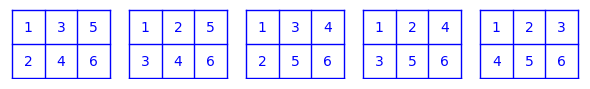

(a) Count the number of two-way increasing tables of shape $(n,n)$ for integer values of $n$ between $1$ and $8$.

(b) Use the comments from the OEIS (entry at index 42) to find the proper name for two-way increasing tables.

(c) Count the number of two-way increasing tables of shape $(n,n-1)$ for integer values of $n$ between $1$ and $8$. Explain the result you get.

In [7]:
# 3a
def two_row_table_count(n):    
    def is_two_way_increasing(table):
        n = len(table[0])
        return (len(table)==2 and set(table[0]+table[1])==set(list(range(1,2*n+1)))
                and all(table[i][j]<table[i][j+1] for i in range(2) for j in range(n-1))
                and all(table[0][i]<table[1][i] for i in range(n)))

    count = 0
    for s in Subsets(2*n, n):
        table = []
        table.append(sorted(list(s)));  # first row
        table.append(sorted(list(Set(list(range(1,2*n+1)))-s)))  # complement of s in second row
        if is_two_way_increasing(table):
            count += 1
    return count

In [8]:
for n in range(1,9):
    print(n,two_row_table_count(n))

1 1
2 2
3 5
4 14
5 42
6 132
7 429
8 1430


In [9]:
oeis(108).comments()[42]  # Catalan numbers since the same sequence as problem 1

'a(n) is also the number of standard Young tableaux of shape (n,n). - _Thotsaporn Thanatipanonda_, Feb 25 2012'

Two-way increasing tables are called *Standard Young Tableaux*.

In [10]:
# 3b
def two_row_special_table_count(n):
    
    def is_standard(table):
        n = len(table[0])
        return (len(table)==2 and set(table[0]+table[1])==set(list(range(1,2*n)))
                and all(table[i][j]<table[i][j+1] for i in range(2) for j in range(len(table[i])-1))
                and all(table[0][i]<table[1][i] for i in range(n-1)))

    count = 0
    for s in Subsets(2*n-1, n):
        table = []
        table.append(sorted(list(s)));  # first row
        table.append(sorted(list(Set(list(range(1,2*n)))-s)))  # complement of s in second row
        if is_standard(table):
            count += 1
    return count

In [11]:
# 3c
for n in range(1,9):
    print(n,two_row_special_table_count(n))

1 1
2 2
3 5
4 14
5 42
6 132
7 429
8 1430


The numbers are the same. This is not surprising, as, in the rectangular shapes, the box in the bottom-right corner is always $2n$.

## Problem 4: Correspondence between two-row, two-way increasing tables and mountain ranges

Since the number of two-way increasing tables of shape $(n,n)$ and the number of mountain ranges with $n$ up-steps and $n$ down-steps is the same, it is natural to ask if there is a *bijection* between them, which is an invertible function on the domain of mountain ranges and image of two-way increasing tables of shape $(n,n)$. We will do so with the help of the FindStat database.

(a) List all collections in FindStat, and find the exact name and the collection ID, of mountain ranges and two-way increasing tables. You should use the names you learned from the OEIS. To list the collections in FindStat, start typing `FindStat`  and then hit `Tab` to see what commands are available.

(b) Look at all the maps from mountain ranges to two-way increasing tables. Use the command `findmap` to do so. There should be a unique interesting map.

(c) For each mountain ranges with 4 up-steps and 4 down-steps, find the corresponding two-way increasing table with 4 entries in each row.  This is the result of the map found in part (b). Then, using `object.pp()`, where object is a given mountain range or table, describe this correspondance as a drawing. Express your answer in the format:
      
      /\/\/\/\
    
      1  3  5  7
      2  4  6  8

The *area* of a mountain range is obtained by first tilting the range 45 degrees counterclockwise, and then counting the number of full squares above the $y=x$-axis and below the path. The triangles right above the axis do not count. Below is an illustrated example, where the full squares have been marked with `x`.
      
                        _____
          /\/\        _| x x 
         /    \      | x x  .
        /      \     | x  . .
                     |  . . .

(d) For each two-way increasing table of shape $(4,4)$, print the value of the area under the corresponding mountain range. *Hint*: the name of the corresponding FindStat statistic is `area`.

(e) The latter is a statistic in FindStat on two-way increasing tables. Can you find that statistic?

*Remark*: This means that the bijection you found between mountain ranges and two-row, two-way increasing tables is statistic-preserving. In other words, you could "see" the area directly in the table. *Extra problem* (optional, probably harder): Explain that correspondence.

In [12]:
# 4a
list(FindStatCollections())

[Cc0001: Permutations,
 Cc0024: Binary words,
 Cc0017: Alternating sign matrices,
 Cc0010: Binary trees,
 Cc0013: Cores,
 Cc0005: Dyck paths,
 Cc0022: Finite Cartan types,
 Cc0018: Gelfand-Tsetlin patterns,
 Cc0020: Graphs,
 Cc0002: Integer partitions,
 Cc0006: Integer compositions,
 Cc0021: Ordered trees,
 Cc0023: Parking functions,
 Cc0029: Lattices,
 Cc0014: Posets,
 Cc0007: Standard tableaux,
 Cc0019: Semistandard tableaux,
 Cc0012: Perfect matchings,
 Cc0009: Set partitions,
 Cc0028: Skew partitions,
 Cc0027: Signed permutations,
 Cc0025: Plane partitions,
 Cc0026: Decorated permutations,
 Cc0030: Ordered set partitions]

In [13]:
print(FindStatCollection(5))
print(FindStatCollection(7))

Cc0005: Dyck paths
Cc0007: Standard tableaux


In [14]:
# 4b
findmap("Dyck paths", "Standard tableaux")

Set of combinatorial maps with domain Cc0005: Dyck paths and codomain Cc0007: Standard tableaux used by FindStat

In [15]:
list(_)

[Mp00033: to two-row standard tableau]

In [16]:
findmap(33).description()

'Return a standard tableau of shape $(n,n)$ where $n$ is the semilength of the Dyck path.\r\n\r\nGiven a Dyck path $D$, its image is given by recording the positions of the up-steps in the first row and the positions of the down-steps in the second row.'

In [17]:
# 4c
for p in DyckWords(4):
    p.pp(type='NE-SE'), print('\n'), findmap(33)(p).pp(), print('\n'), print('\n')

/\/\/\/\


  1  3  5  7
  2  4  6  8




     /\ 
/\/\/  \


  1  3  5  6
  2  4  7  8




   /\   
/\/  \/\


  1  3  4  7
  2  5  6  8




   /\/\ 
/\/    \


  1  3  4  6
  2  5  7  8




    /\  
   /  \ 
/\/    \


  1  3  4  5
  2  6  7  8




 /\     
/  \/\/\


  1  2  5  7
  3  4  6  8




 /\  /\ 
/  \/  \


  1  2  5  6
  3  4  7  8




 /\/\   
/    \/\


  1  2  4  7
  3  5  6  8




 /\/\/\ 
/      \


  1  2  4  6
  3  5  7  8




    /\  
 /\/  \ 
/      \


  1  2  4  5
  3  6  7  8




  /\    
 /  \   
/    \/\


  1  2  3  7
  4  5  6  8




  /\    
 /  \/\ 
/      \


  1  2  3  6
  4  5  7  8




  /\/\  
 /    \ 
/      \


  1  2  3  5
  4  6  7  8




   /\   
  /  \  
 /    \ 
/      \


  1  2  3  4
  5  6  7  8






In [18]:
# 4d
for p in DyckWords(4):
    findmap(33)(p).pp()
    print('The tableau above corresponds to area', findstat(12)(p))  # Stat 12 is area under a Dyck Path

  1  3  5  7
  2  4  6  8
The tableau above corresponds to area 0
  1  3  5  6
  2  4  7  8
The tableau above corresponds to area 1
  1  3  4  7
  2  5  6  8
The tableau above corresponds to area 1
  1  3  4  6
  2  5  7  8
The tableau above corresponds to area 2
  1  3  4  5
  2  6  7  8
The tableau above corresponds to area 3
  1  2  5  7
  3  4  6  8
The tableau above corresponds to area 1
  1  2  5  6
  3  4  7  8
The tableau above corresponds to area 2
  1  2  4  7
  3  5  6  8
The tableau above corresponds to area 2
  1  2  4  6
  3  5  7  8
The tableau above corresponds to area 3
  1  2  4  5
  3  6  7  8
The tableau above corresponds to area 4
  1  2  3  7
  4  5  6  8
The tableau above corresponds to area 3
  1  2  3  6
  4  5  7  8
The tableau above corresponds to area 4
  1  2  3  5
  4  6  7  8
The tableau above corresponds to area 5
  1  2  3  4
  5  6  7  8
The tableau above corresponds to area 6


In [19]:
# 4e
findstat([(findmap(33)(p), findstat(12)(p)) for p in DyckWords(5)])

 0: St000057 (quality [100, 100])
 1: St000018oMp00081 with offset 15 (quality [100, 100])
 2: St000057oMp00085 (quality [100, 100])
 3: St000359oMp00081 with offset 10 (quality [100, 100])
 4: St000463oMp00081 with offset 15 (quality [100, 100])
 5: St000018oMp00081oMp00085 with offset 15 (quality [100, 100])
 6: St000359oMp00081oMp00085 with offset 10 (quality [100, 100])
 7: St000463oMp00081oMp00085 with offset 15 (quality [100, 100])
 8: St000246oMp00241oMp00081 with offset 26 (quality [38, 45])
 9: St000883oMp00241oMp00081 with offset 2 (quality [38, 45])
10: St000293oMp00094oMp00294 with offset 11 (quality [12, 45])
11: St001437oMp00094oMp00294 with offset 6 (quality [12, 45])

In [20]:
findstat(57).description()

"The Shynar inversion number of a standard tableau.\r\n\r\nShynar's inversion number is the number of inversion pairs in a standard Young tableau, where an inversion pair is defined as a pair of integers (x,y) such that y > x and y appears strictly southwest of x in the tableau."

For the extra problem: In the Shynar statistic, every inversion $(x,y)$ corresponds to a square in the row (from the bottom) of the rotated Dyck Path corresponding to the column of $x$. This is why the two statistics are equal.